<a href="https://colab.research.google.com/github/Aashir0524/H1N1-vaccine-prediction/blob/main/H1N1_Irfan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [ ]:
df=pd.read_csv('h1n1_vaccine_prediction.csv')
df

,unique_id,h1n1_worry,h1n1_awareness,antiviral_medication,contact_avoidance,bought_face_mask,wash_hands_frequently,avoid_large_gatherings,reduced_outside_home_cont,avoid_touch_face,...,race,sex,income_level,marital_status,housing_status,employment,census_msa,no_of_adults,no_of_children,h1n1_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,Non-MSA,0.0,0.0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,...,White,Male,Below Poverty,Not Married,Rent,Employed,"MSA, Not Principle City",0.0,0.0,0
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,"MSA, Not Principle City",2.0,0.0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,...,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,"MSA, Principle City",0.0,0.0,0
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,...,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,"MSA, Not Principle City",1.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,Non-MSA,0.0,0.0,0
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,"MSA, Principle City",1.0,0.0,0
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,...,White,Female,NaN,Not Married,Own,NaN,"MSA, Not Principle City",0.0,0.0,0
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,...,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,Non-MSA,1.0,0.0,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 34 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   unique_id                  26707 non-null  int64  
 1   h1n1_worry                 26615 non-null  float64
 2   h1n1_awareness             26591 non-null  float64
 3   antiviral_medication       26636 non-null  float64
 4   contact_avoidance          26499 non-null  float64
 5   bought_face_mask           26688 non-null  float64
 6   wash_hands_frequently      26665 non-null  float64
 7   avoid_large_gatherings     26620 non-null  float64
 8   reduced_outside_home_cont  26625 non-null  float64
 9   avoid_touch_face           26579 non-null  float64
 10  dr_recc_h1n1_vacc          24547 non-null  float64
 11  dr_recc_seasonal_vacc      24547 non-null  float64
 12  chronic_medic_condition    25736 non-null  float64
 13  cont_child_undr_6_mnths    25887 non-null  flo

In [ ]:
df.describe()

,unique_id,h1n1_worry,h1n1_awareness,antiviral_medication,contact_avoidance,bought_face_mask,wash_hands_frequently,avoid_large_gatherings,reduced_outside_home_cont,avoid_touch_face,...,has_health_insur,is_h1n1_vacc_effective,is_h1n1_risky,sick_from_h1n1_vacc,is_seas_vacc_effective,is_seas_risky,sick_from_seas_vacc,no_of_adults,no_of_children,h1n1_vaccine
count,26707.000000,26615.000000,26591.000000,26636.000000,26499.000000,26688.000000,26665.000000,26620.00000,26625.000000,26579.000000,...,14433.00000,26316.000000,26319.000000,26312.000000,26245.000000,26193.000000,26170.000000,26458.000000,26458.000000,26707.000000
mean,13353.000000,1.618486,1.262532,0.048844,0.725612,0.068982,0.825614,0.35864,0.337315,0.677264,...,0.87972,3.850623,2.342566,2.357670,4.025986,2.719162,2.118112,0.886499,0.534583,0.212454
std,7709.791156,0.910311,0.618149,0.215545,0.446214,0.253429,0.379448,0.47961,0.472802,0.467531,...,0.32530,1.007436,1.285539,1.362766,1.086565,1.385055,1.332950,0.753422,0.928173,0.409052
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,6676.500000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,...,1.00000,3.000000,1.000000,1.000000,4.000000,2.000000,1.000000,0.000000,0.000000,0.000000
50%,13353.000000,2.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.00000,0.000000,1.000000,...,1.00000,4.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.000000,0.000000
75%,20029.500000,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.00000,1.000000,1.000000,...,1.00000,5.000000,4.000000,4.000000,5.000000,4.000000,4.000000,1.000000,1.000000,0.000000
max,26706.000000,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,...,1.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000,3.000000,1.000000


In [ ]:
!pip install autoviz
!pip install xlrd

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 30.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 361.8/361.8 kB 32.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 73.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 81.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 83.2 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of panel to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 36.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 47.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 43.4 MB/s eta 0:00:00
 

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns


AV = AutoViz_Class()

Shape of your Data Set loaded: (26707, 34)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  10
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  6
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  3
    Number of Numeric-Boolean Columns =  14
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    34 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
10 numeric variables in data exceeds limit, taking top 30 variables
Number of All Scatter Plots = 55

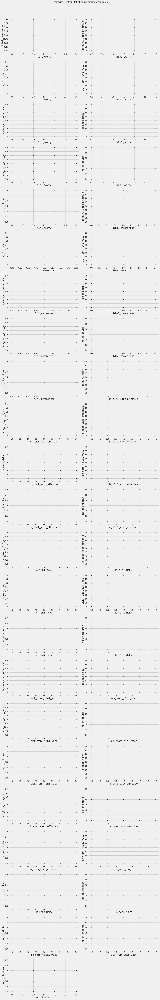

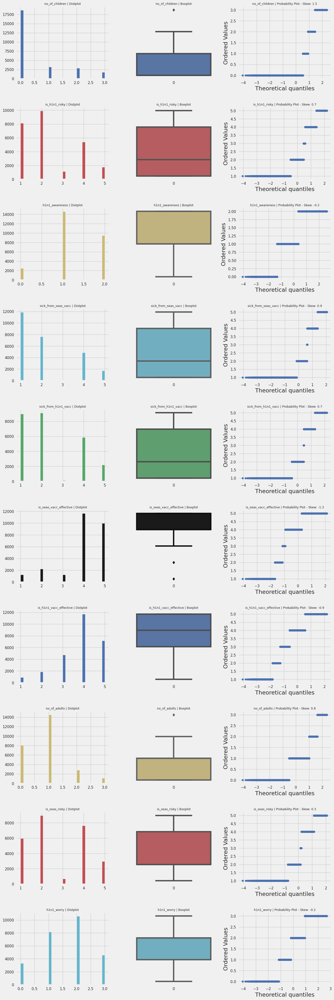

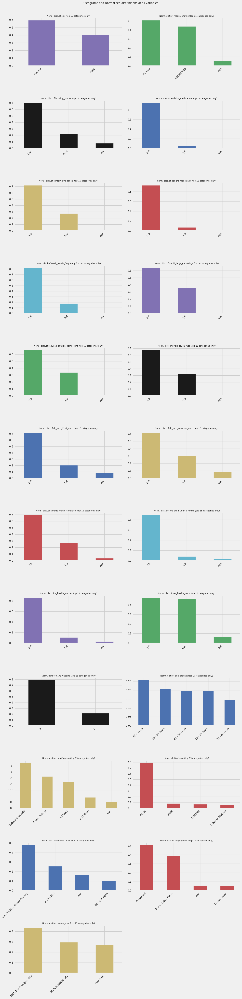

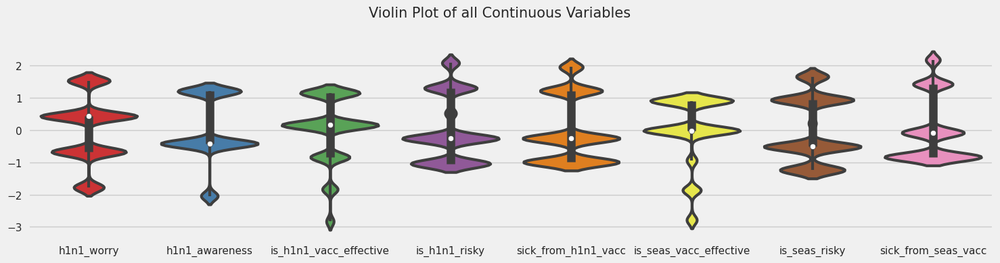

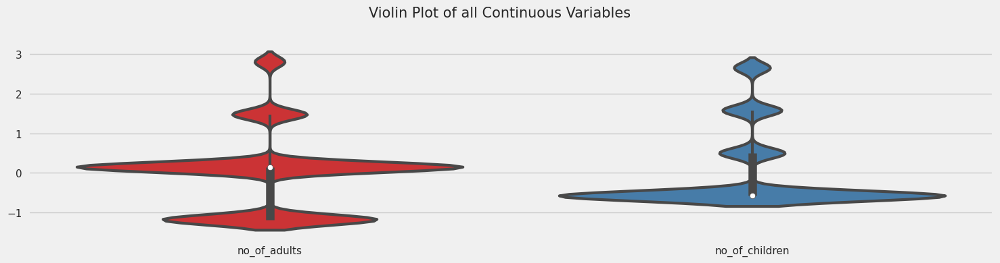

...

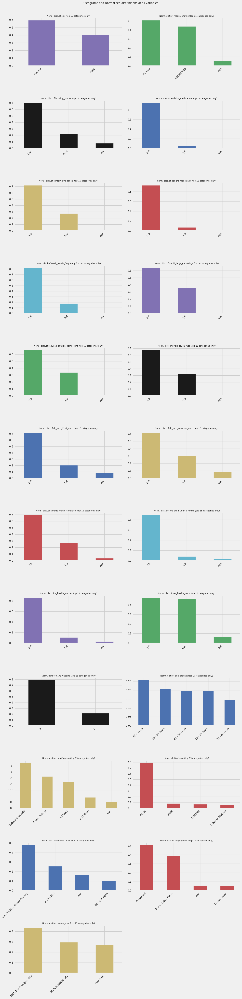

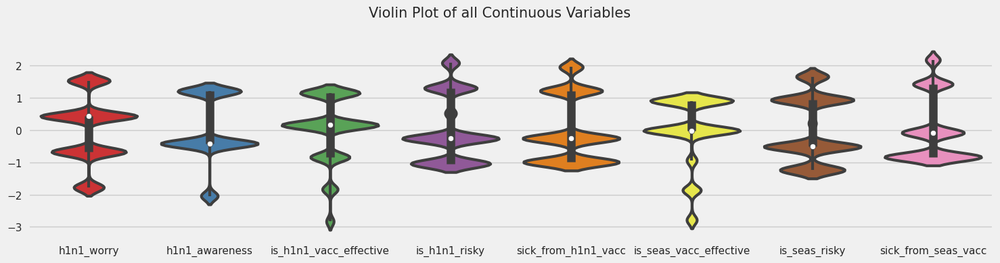

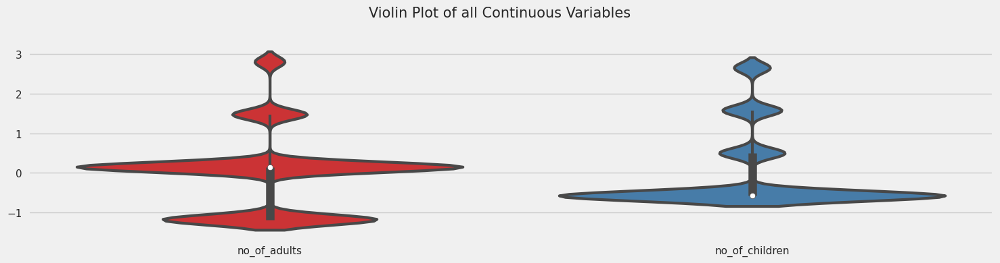

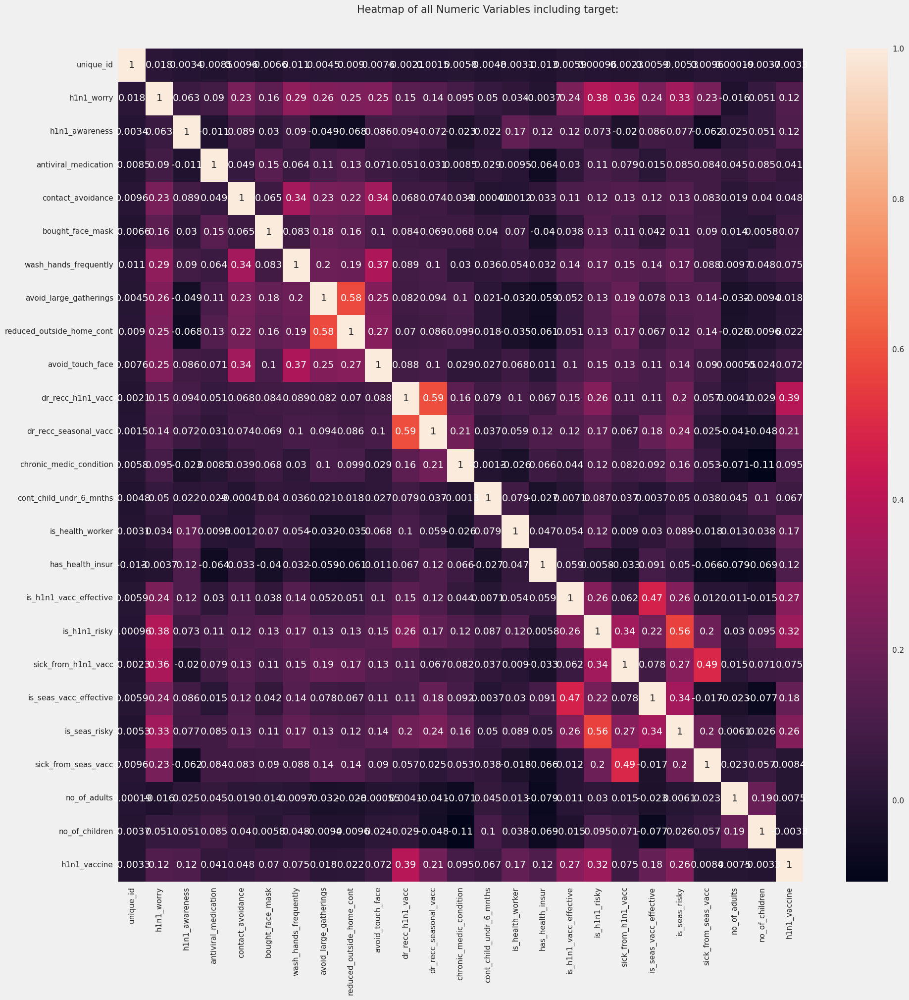

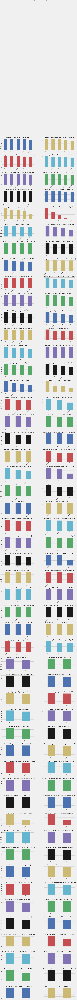

All Plots done
Time to run AutoViz = 114 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
filename = 'h1n1_vaccine_prediction.csv'
sep = ","
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar="",
    dfte=None,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg"
)

In [ ]:
train, test = train_test_split(df, train_size=0.80, test_size=0.20, stratify=df['h1n1_vaccine'], random_state=2)

train.shape, test.shape

((21365, 34), (5342, 34))

In [ ]:
train.T.duplicated()

unique_id                    False
h1n1_worry                   False
h1n1_awareness               False
antiviral_medication         False
contact_avoidance            False
bought_face_mask             False
wash_hands_frequently        False
avoid_large_gatherings       False
reduced_outside_home_cont    False
avoid_touch_face             False
dr_recc_h1n1_vacc            False
dr_recc_seasonal_vacc        False
chronic_medic_condition      False
cont_child_undr_6_mnths      False
is_health_worker             False
has_health_insur             False
is_h1n1_vacc_effective       False
is_h1n1_risky                False
sick_from_h1n1_vacc          False
is_seas_vacc_effective       False
is_seas_risky                False
sick_from_seas_vacc          False
age_bracket                  False
qualification                False
race                         False
sex                          False
income_level                 False
marital_status               False
housing_status      

In [ ]:
train.describe(exclude='number')

,age_bracket,qualification,race,sex,income_level,marital_status,housing_status,employment,census_msa
count,21365,20231,21365,21365,17824,20221,19716,20185,21365
unique,5,4,4,2,3,2,2,3,3
top,65+ Years,College Graduate,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,"MSA, Not Principle City"
freq,5481,8055,16982,12727,10183,10822,15020,10834,9384


In [ ]:
def engineer(df):

    # Create "behaviorals" feature
    behaviorals = [col for col in df.columns if 'behavioral' in col]
    df['behaviorals'] = df[behaviorals].sum(axis=1)

    # Transform employment_status feature values("Not in Labor Force" -> "Unemployed")
    fixed_data = []
    for i in df["employment"]:
      if i == "Not in Labor Force":
        fixed_data.append("Unemployed")
      else:
        fixed_data.append(i)
    df["employment"] = fixed_data
    # Remove any feature with cardinality of over 30
    selected_cols = df.select_dtypes(include=['number', 'object'])
    colnames = selected_cols.columns.tolist()
    labels = selected_cols.nunique()

    selected_features = labels[labels <= 30].index.tolist()
    df = df[selected_features]

    return df


train = engineer(train)
test = engineer(test)

In [ ]:
# Separate the target feature from the training data
target='h1n1_vaccine'
features = train.drop(columns=[target]).columns

# Diving training, validation, and testing data into X and y
X_train = train[features]
y_train = train[target]
X_test = test[features]
y_test = test[target]

In [ ]:
# Import libraries for OrdinalEncoder, SimpleImputer, RandomForestClassifier, and make_pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

In [ ]:
%%time

# ordinal encoding
pipe_ord = make_pipeline(
    OneHotEncoder(),
    SimpleImputer(),
    RandomForestClassifier(n_estimators=100, random_state=10, max_depth=14, oob_score=True, n_jobs=-1, criterion="gini", min_samples_split=5, max_features=6)
)

pipe_ord.fit(X_train, y_train)
print('Score', pipe_ord.score(X_test, y_test))

Score 0.8472482216398353
CPU times: user 14.1 s, sys: 79.4 ms, total: 14.2 s
Wall time: 8.5 s


In [ ]:
pipe_ord.named_steps['randomforestclassifier'].oob_score_

0.847835244558858

In [ ]:
y_pred_test = pipe_ord.predict(X_test)
y_pred_test = pd.Series(y_pred_test)
y_pred_test.value_counts()

0    4795
1     547
dtype: int64

In [ ]:
id = pd.Series(range(len(y_pred_test)))
y_pred_test = pd.Series(y_pred_test)
prediction = pd.concat([id, y_pred_test], axis=1)
prediction.rename(columns={0:"id", 1:target}, inplace=True)

# Display the prediction data information
print(prediction.shape)
print(prediction.value_counts(target))

# Export the dataset to a *csv* file.
prediction.to_csv("prediction.csv",index=False)
prediction

(5342, 2)
h1n1_vaccine
0    4795
1     547
dtype: int64


,id,h1n1_vaccine
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0
...,...,...
5337,5337,0
5338,5338,0
5339,5339,0
5340,5340,0
